In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import rawpy

In [2]:
# rawpy é opcional (só serve para RAW mosaico)
try:
    import rawpy
except Exception:
    rawpy = None

import tifffile

def _tiff_linear_dng_to_bgr8(path):
    """
    Lê um DNG linear (Photometric 34892) com tifffile, aplica:
      - BlackLevel / WhiteLevel
      - AsShotNeutral (WB)
      - BaselineExposure (EV)
      - Gamma simples (~sRGB) para exibir
    Retorna BGR uint8 (compatível com OpenCV).
    """
    try:
        with tifffile.TiffFile(path) as tf:
            arr = tf.asarray()  # HxWxC, geralmente uint16
            if arr.ndim == 2:
                raise RuntimeError("DNG mosaico; use rawpy/LibRaw.")
            img = arr[..., :3].astype(np.float64)

            tags = tf.pages[0].tags
            def get_tag(name, default=None):
                try:
                    return tags[name].value
                except KeyError:
                    return default

            # BlackLevel / WhiteLevel (por canal)
            bl = get_tag("BlackLevel", 0)
            wl = get_tag("WhiteLevel", 65535)
            bl = np.array(bl, dtype=np.float64).ravel()
            wl = np.array(wl, dtype=np.float64).ravel()
            if bl.size == 1: bl = np.repeat(bl[0], 3)
            if wl.size == 1: wl = np.repeat(wl[0], 3)
            bl = bl[:3]; wl = wl[:3]

            img = np.clip(img - bl.reshape(1,1,3), 0, None)
            img = img / np.maximum((wl - bl).reshape(1,1,3), 1.0)

            # White balance via AsShotNeutral (se existir)
            asn = get_tag("AsShotNeutral", None)
            if asn is not None:
                asn = np.array(asn, dtype=np.float64).ravel()[:3]
                wb = 1.0 / asn
                wb = wb / wb[1]  # normaliza G=1
                img *= wb.reshape(1,1,3)

            # BaselineExposure (em EV)
            be = get_tag("BaselineExposure", 0.0)
            try:
                img *= (2.0 ** float(be))
            except Exception:
                pass

            # Clip para [0,1] e aplica uma gamma ~sRGB p/ visualização
            img = np.clip(img, 0.0, 1.0)
            img = np.power(img, 1/2.2)

            # Para OpenCV (uint8 BGR)
            img8 = (img * 255.0 + 0.5).astype(np.uint8)
            bgr8 = cv2.cvtColor(img8, cv2.COLOR_RGB2BGR)
            return bgr8

    except ValueError as e:
        # tifffile sinaliza JPEG-XL sem imagecodecs com este ValueError
        if "JPEGXL_DNG" in str(e) or "imagecodecs" in str(e):
            print("Este DNG usa compressão JPEG-XL. Instale 'imagecodecs' "
                  "(pip install -U imagecodecs  ou  conda install -c conda-forge imagecodecs).")
            return None
        raise
    except Exception as e:
        print(f"Erro ao ler DNG linear com tifffile: {e}")
        return None

def carregar_imagem(caminho_arquivo):
    """
    Carrega imagem para processamento com OpenCV.
    - DNG mosaico: usa rawpy (se disponível).
    - DNG linear (Photometric 34892): fallback com tifffile (requer imagecodecs p/ JPEG-XL).
    - Outros formatos: cv2.imread padrão.
    Retorna BGR uint8.
    """
    if caminho_arquivo.lower().endswith('.dng'):
        # 1) Tenta rawpy (funciona para RAW mosaico; falha para DNG linear)
        if rawpy is not None:
            try:
                with rawpy.imread(caminho_arquivo) as raw:
                    # Evita auto-bright para consistência entre frames
                    rgb = raw.postprocess(
                        use_camera_wb=True,
                        no_auto_bright=True,
                        output_bps=8,           # retorna uint8
                        gamma=(2.222, 4.5)      # aproxima sRGB (padrão do rawpy)
                    )
                return cv2.cvtColor(rgb, cv2.COLOR_RGB2BGR)
            except Exception:
                # Se cair aqui, provavelmente é DNG linear ou variante não suportada -> fallback
                pass

        # 2) Fallback para DNG linear com tifffile
        return _tiff_linear_dng_to_bgr8(caminho_arquivo)

    # 3) Outros formatos (jpg/png/etc.)
    return cv2.imread(caminho_arquivo, cv2.IMREAD_COLOR)


In [3]:
def analisar_conjunto(caminho_pasta, detectores):
    """
    Função principal que analisa um conjunto completo de imagens em uma pasta
    com uma lista de detectores.
    """
    print(f"=========================================================")
    print(f"Analisando o conjunto de imagens em: '{caminho_pasta}'")
    print(f"=========================================================")

    pasta_resultados = "resultados_etapa2"
    if not os.path.exists(pasta_resultados):
        os.makedirs(pasta_resultados)

    # Encontra todas as imagens e as ordena numericamente
    arquivos_de_imagem = glob.glob(os.path.join(caminho_pasta, '*'))
    # Lógica para ordenar corretamente: extrai o número do final do nome do arquivo
    arquivos_de_imagem.sort(key=lambda f: int(''.join(filter(str.isdigit, f.split('-')[-1]))))

    if len(arquivos_de_imagem) < 2:
        print("Erro: São necessárias pelo menos 2 imagens na pasta.")
        return

    # Itera sobre cada detector
    for nome_detector in detectores:
        print(f"\n--- Análise para o detector: {nome_detector.upper()} ---")

        if nome_detector == 'sift':
            detector = cv2.SIFT_create()
            norm_type = cv2.NORM_L2
        elif nome_detector == 'orb':
            detector = cv2.ORB_create(nfeatures=2000)
            norm_type = cv2.NORM_HAMMING
        elif nome_detector == 'akaze':
            detector = cv2.AKAZE_create()
            norm_type = cv2.NORM_HAMMING
        else:
            print(f"Detector '{nome_detector}' não reconhecido.")
            continue

        total_keypoints, total_matches, pares_analisados = 0, 0, 0

        for i in range(len(arquivos_de_imagem)):
            img_bgr = carregar_imagem(arquivos_de_imagem[i])
            if img_bgr is None: continue
            
            img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
            keypoints, descriptors = detector.detectAndCompute(img_gray, None)
            total_keypoints += len(keypoints)

            if i == 0: # Visualização de Keypoints da primeira imagem
                img_with_keypoints = cv2.drawKeypoints(img_gray, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                nome_arquivo_keypoints = f"{os.path.basename(caminho_pasta)}_{nome_detector}_keypoints.jpg"
                cv2.imwrite(os.path.join(pasta_resultados, nome_arquivo_keypoints), img_with_keypoints)
                print(f"-> Imagem com keypoints salva em '{os.path.join(pasta_resultados, nome_arquivo_keypoints)}'")
                
                # Exibir no notebook
                plt.figure(figsize=(12, 8))
                plt.imshow(img_with_keypoints)
                plt.title(f'Keypoints ({nome_detector.upper()}) em {os.path.basename(arquivos_de_imagem[i])}')
                plt.axis('off')
                plt.show()


            if i > 0:
                bf_matcher = cv2.BFMatcher(norm_type, crossCheck=True)
                matches = bf_matcher.match(des_anterior, descriptors)
                matches = sorted(matches, key=lambda x: x.distance)
                total_matches += len(matches)
                pares_analisados += 1
                
                if i == 1: # Visualização de Matches do primeiro par
                    img_anterior_bgr = carregar_imagem(arquivos_de_imagem[i-1])
                    img_matches = cv2.drawMatches(img_anterior_bgr, kp_anterior, img_bgr, keypoints, matches[:75], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
                    nome_arquivo_matches = f"{os.path.basename(caminho_pasta)}_{nome_detector}_matches.jpg"
                    cv2.imwrite(os.path.join(pasta_resultados, nome_arquivo_matches), img_matches)
                    print(f"-> Imagem com matches salva em '{os.path.join(pasta_resultados, nome_arquivo_matches)}'")

                    # Exibir no notebook
                    plt.figure(figsize=(20, 10))
                    plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
                    plt.title(f'Top 75 Matches ({nome_detector.upper()}) entre as duas primeiras imagens')
                    plt.axis('off')
                    plt.show()

            kp_anterior, des_anterior = keypoints, descriptors

        avg_keypoints = total_keypoints / len(arquivos_de_imagem)
        avg_matches = total_matches / pares_analisados if pares_analisados > 0 else 0
        
        print("\n--- Resumo Estatístico ---")
        print(f"Média de keypoints por imagem: {avg_keypoints:.2f}")
        print(f"Média de matches por par consecutivo: {avg_matches:.2f}")

Analisando o conjunto de imagens em: 'images-normal'

--- Análise para o detector: SIFT ---
-> Imagem com keypoints salva em 'resultados_etapa2/images-normal_sift_keypoints.jpg'


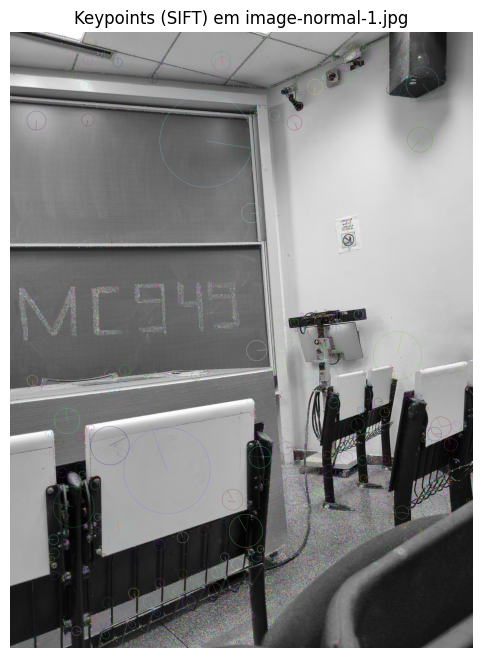

-> Imagem com matches salva em 'resultados_etapa2/images-normal_sift_matches.jpg'


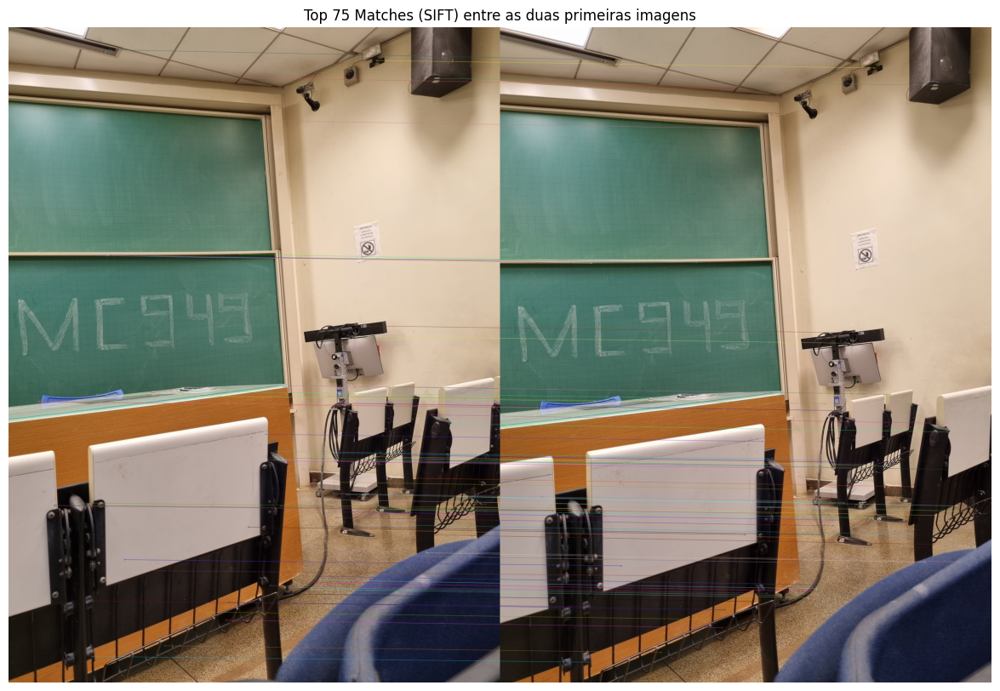


--- Resumo Estatístico ---
Média de keypoints por imagem: 16123.21
Média de matches por par consecutivo: 7249.48

--- Análise para o detector: ORB ---
-> Imagem com keypoints salva em 'resultados_etapa2/images-normal_orb_keypoints.jpg'


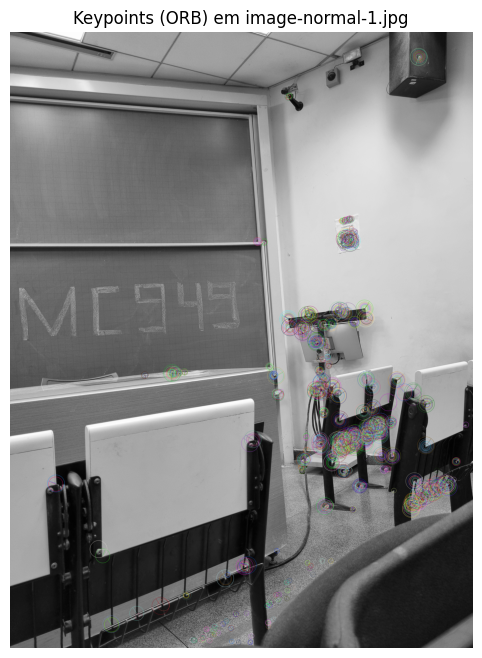

-> Imagem com matches salva em 'resultados_etapa2/images-normal_orb_matches.jpg'


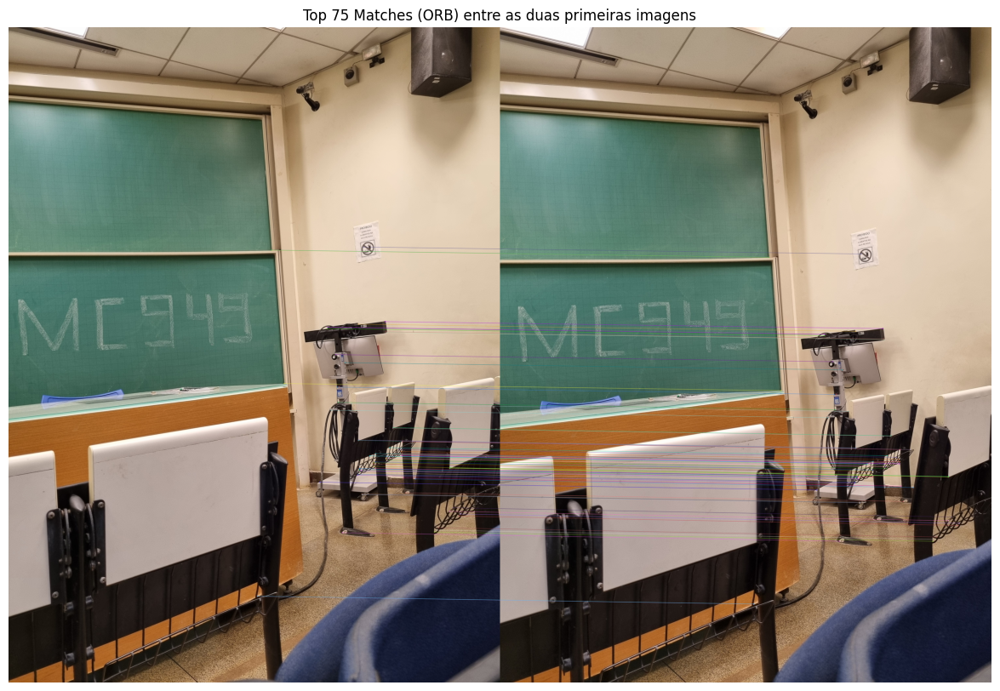


--- Resumo Estatístico ---
Média de keypoints por imagem: 2000.00
Média de matches por par consecutivo: 1310.70

--- Análise para o detector: AKAZE ---
-> Imagem com keypoints salva em 'resultados_etapa2/images-normal_akaze_keypoints.jpg'


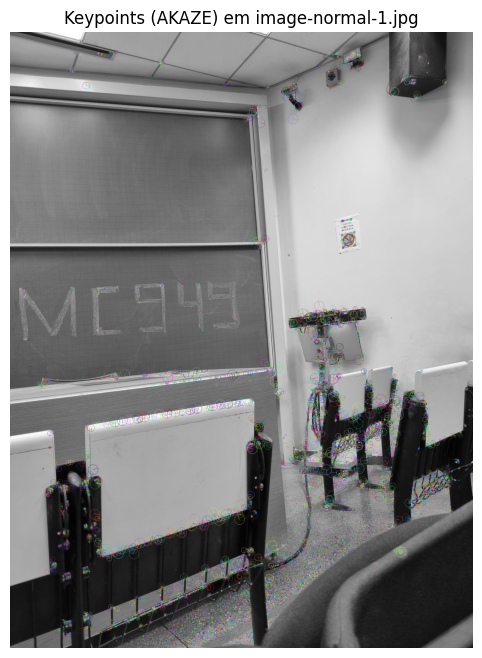

-> Imagem com matches salva em 'resultados_etapa2/images-normal_akaze_matches.jpg'


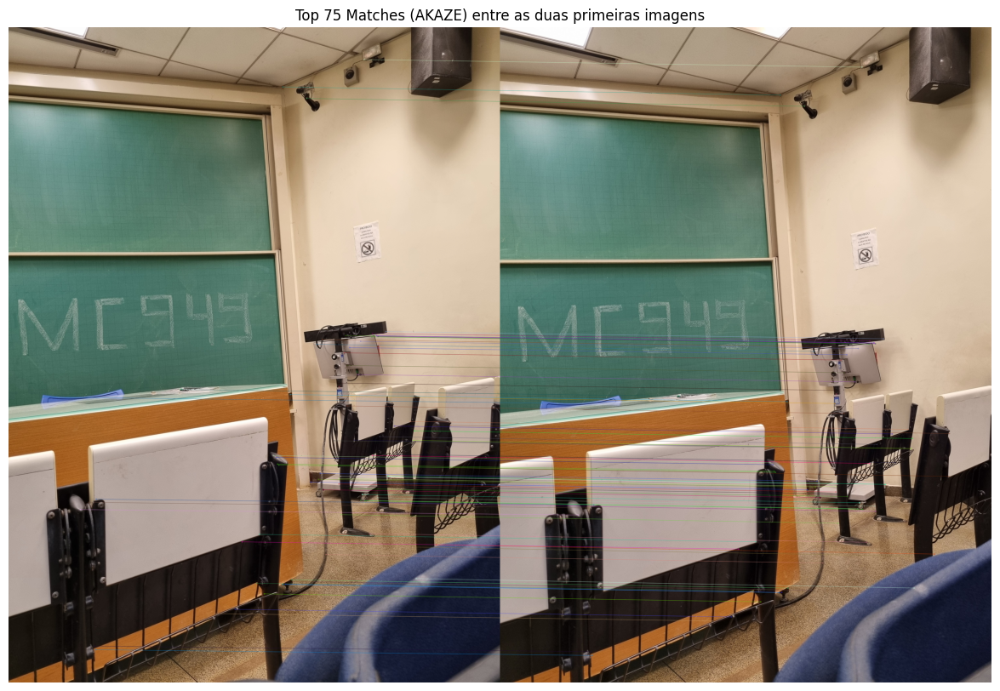


--- Resumo Estatístico ---
Média de keypoints por imagem: 3888.69
Média de matches por par consecutivo: 2943.70


In [5]:
caminho_normal = "images-normal"
detectores = ['sift', 'orb', 'akaze']
analisar_conjunto(caminho_normal, detectores)

Analisando o conjunto de imagens em: 'images-pro'

--- Análise para o detector: SIFT ---
-> Imagem com keypoints salva em 'resultados_etapa2/images-pro_sift_keypoints.jpg'


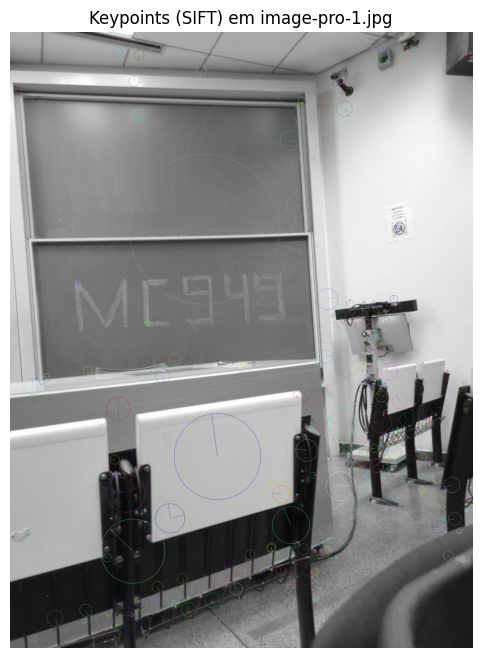

-> Imagem com matches salva em 'resultados_etapa2/images-pro_sift_matches.jpg'


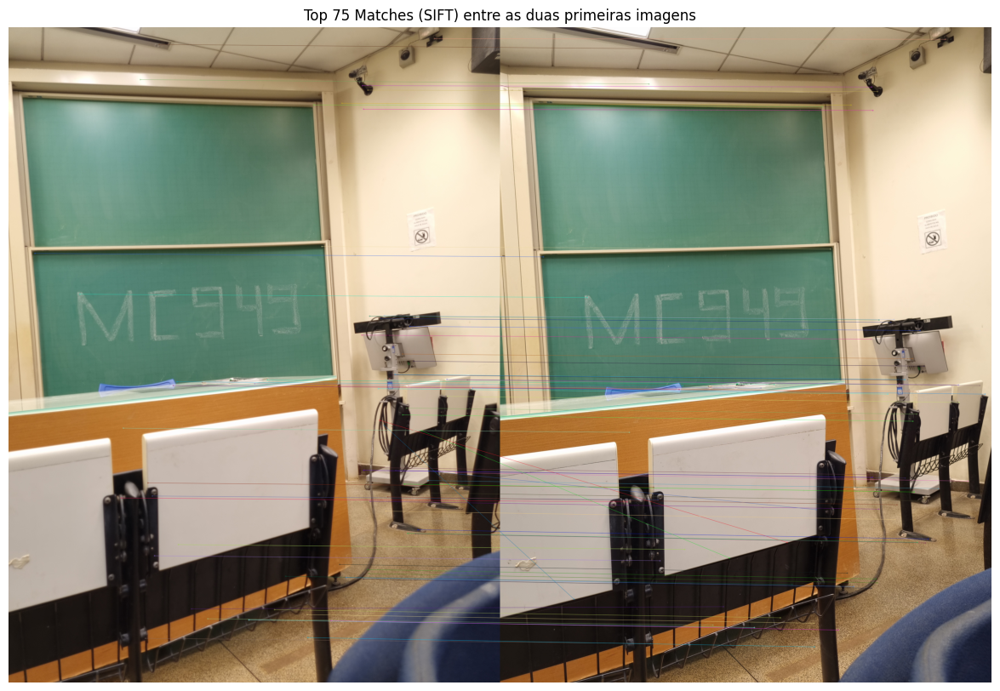


--- Resumo Estatístico ---
Média de keypoints por imagem: 10800.50
Média de matches por par consecutivo: 4612.52

--- Análise para o detector: ORB ---
-> Imagem com keypoints salva em 'resultados_etapa2/images-pro_orb_keypoints.jpg'


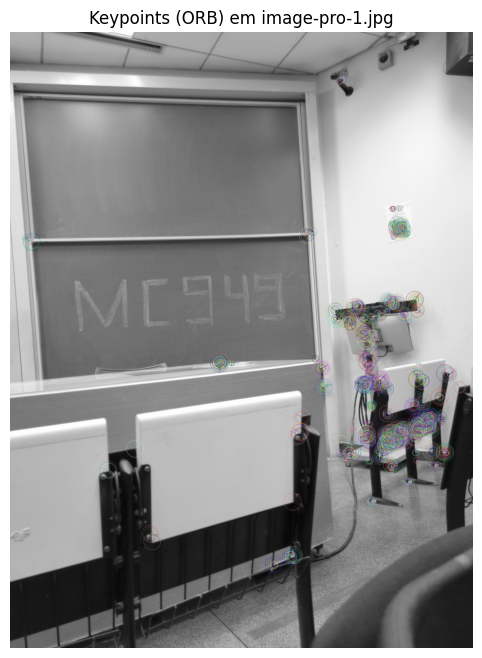

-> Imagem com matches salva em 'resultados_etapa2/images-pro_orb_matches.jpg'


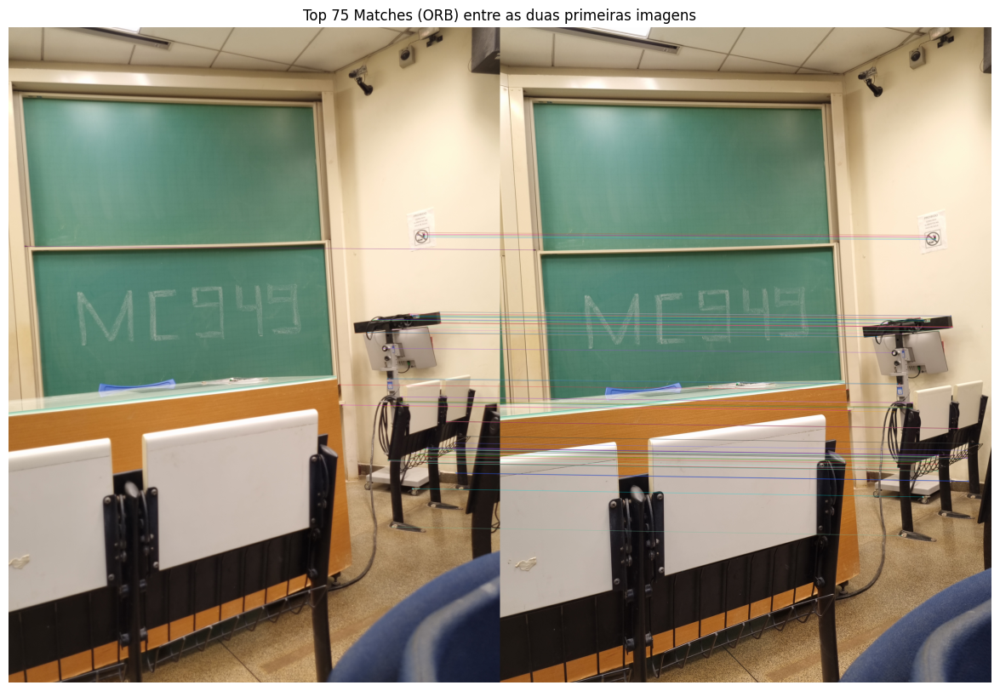


--- Resumo Estatístico ---
Média de keypoints por imagem: 2000.00
Média de matches por par consecutivo: 1033.24

--- Análise para o detector: AKAZE ---
-> Imagem com keypoints salva em 'resultados_etapa2/images-pro_akaze_keypoints.jpg'


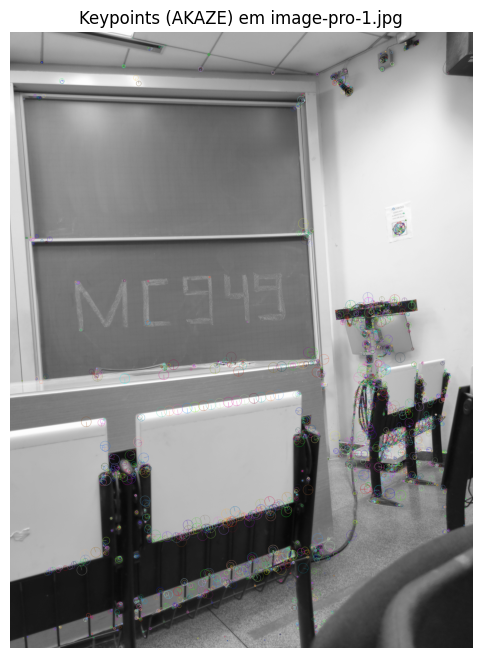

-> Imagem com matches salva em 'resultados_etapa2/images-pro_akaze_matches.jpg'


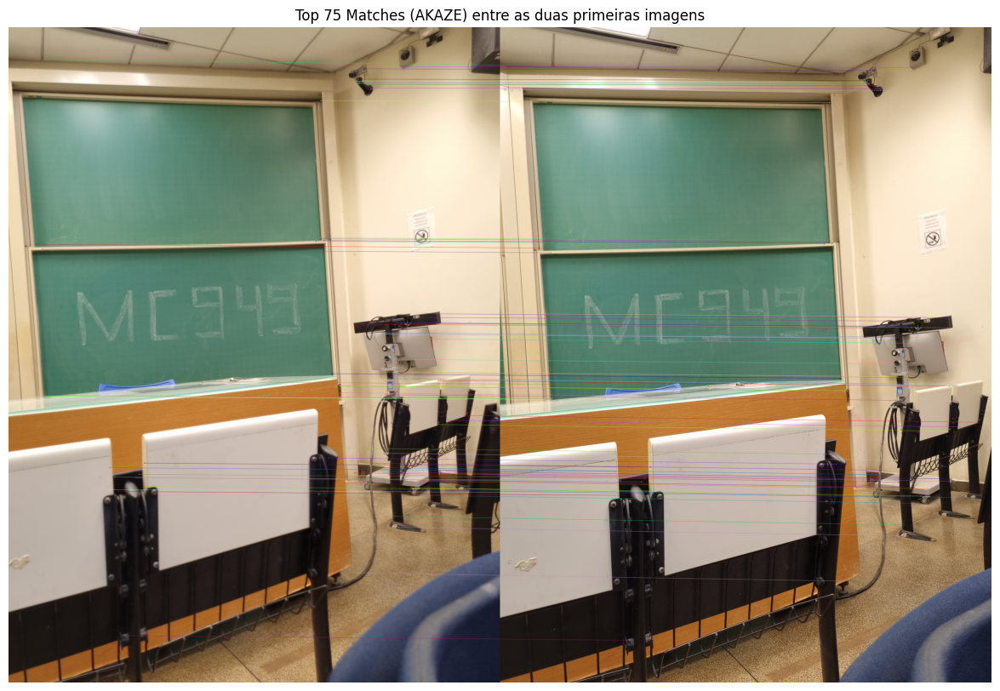


--- Resumo Estatístico ---
Média de keypoints por imagem: 3441.05
Média de matches por par consecutivo: 2271.19


In [6]:
caminho_pro = "images-pro"
detectores = ['sift', 'orb', 'akaze']
analisar_conjunto(caminho_pro, detectores)

Analisando o conjunto de imagens em: 'images-converted-br-png-8bit'

--- Análise para o detector: SIFT ---
-> Imagem com keypoints salva em 'resultados_etapa2/images-converted-br-png-8bit_sift_keypoints.jpg'


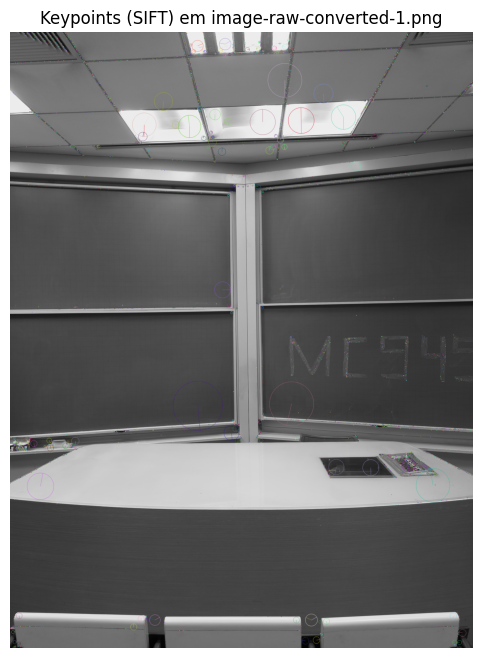

-> Imagem com matches salva em 'resultados_etapa2/images-converted-br-png-8bit_sift_matches.jpg'


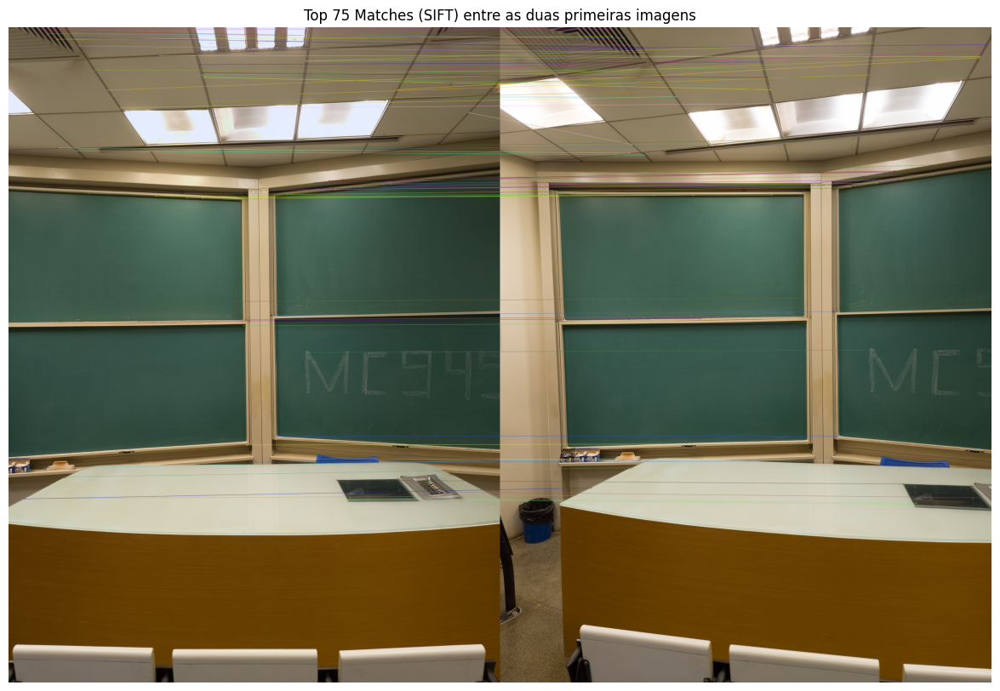


--- Resumo Estatístico ---
Média de keypoints por imagem: 23762.77
Média de matches por par consecutivo: 8815.45

--- Análise para o detector: ORB ---
-> Imagem com keypoints salva em 'resultados_etapa2/images-converted-br-png-8bit_orb_keypoints.jpg'


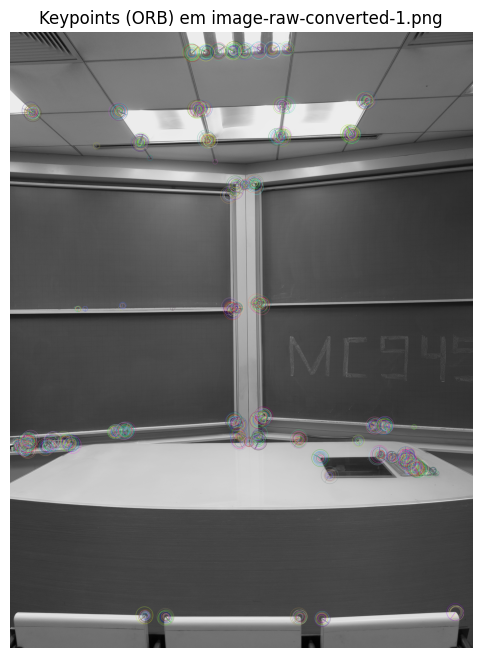

-> Imagem com matches salva em 'resultados_etapa2/images-converted-br-png-8bit_orb_matches.jpg'


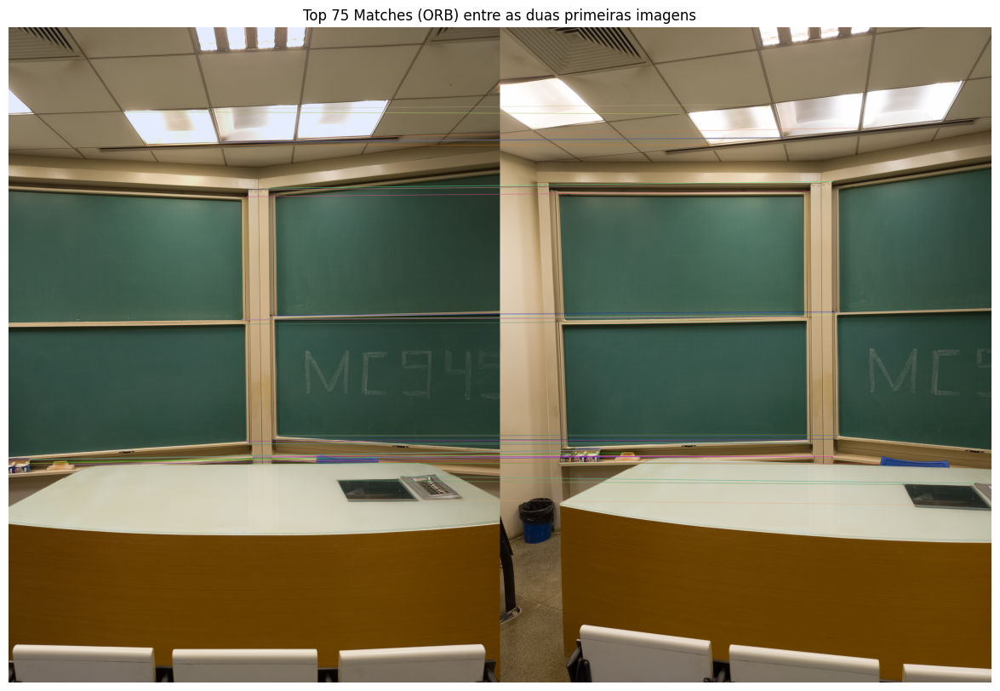


--- Resumo Estatístico ---
Média de keypoints por imagem: 2000.00
Média de matches por par consecutivo: 769.69

--- Análise para o detector: AKAZE ---
-> Imagem com keypoints salva em 'resultados_etapa2/images-converted-br-png-8bit_akaze_keypoints.jpg'


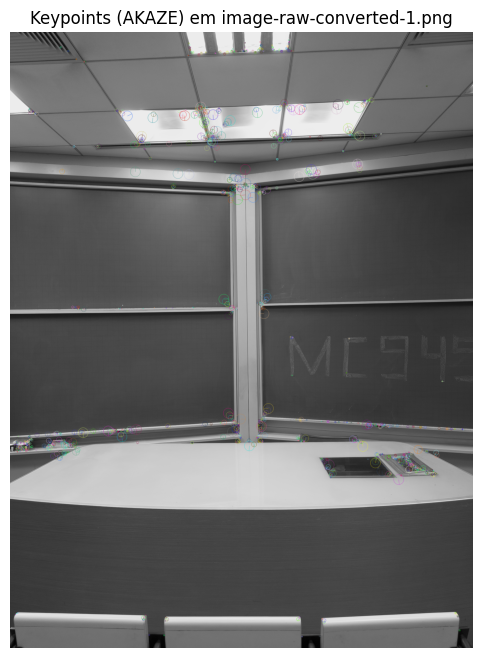

-> Imagem com matches salva em 'resultados_etapa2/images-converted-br-png-8bit_akaze_matches.jpg'


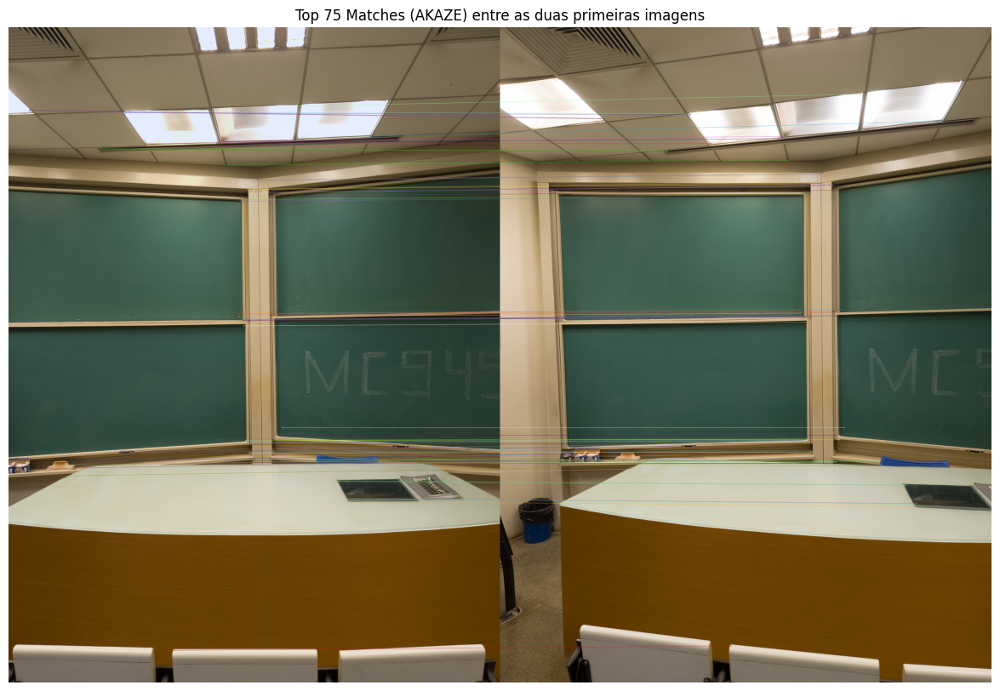


--- Resumo Estatístico ---
Média de keypoints por imagem: 4102.47
Média de matches por par consecutivo: 1889.00


In [4]:
caminho_raw = "images-converted-br-png-8bit"
detectores = ['sift', 'orb', 'akaze']
analisar_conjunto(caminho_raw, detectores)

# Etapa 2: Análise e Justificativa da Escolha

## 1. Coleta de Dados Quantitativos

Após a execução dos testes, os seguintes resultados foram obtidos:

| Conjunto | Detector | Média de Keypoints/Imagem | Média de Matches/Par |
| :--- | :--- | :--- | :--- |
| **images-normal**| SIFT | 16123.21 | 7249.48 |
| (61 imagens) | ORB | 2000.00 | 1310.70 |
| | AKAZE | 3888.69 | 2943.70 |
| **images-pro** | SIFT | 10800.50 | 4612.52 |
| (22 imagens) | ORB | 2000.00 | 1033.24 |
| | AKAZE | 3441.05 | 2271.19 |
| **images-converted-tiff-8bit** | SIFT | - | - |
| (31 imagens .tiff)| ORB | - | - |
| | AKAZE | - | - |
| **images-developed-png-8bit** | SIFT | 23762.77 | 8815.45 |
| (31 imagens .png)| ORB | 2000.00 | 769.69 |
| | AKAZE | 4102.47 | 1889.00 |
| **images-developed-png-16bit** | SIFT | - | - |
| (31 imagens .png)| ORB | - | - |
| | AKAZE | - | - |
| **images-developed-tiff-8bit** | SIFT | - | - |
| (31 imagens .tiff| ORB | - | - |
| | AKAZE | - | - |
| **images-developed-tiff-16bit** | SIFT | - | - |
| (31 imagens .tiff)| ORB | - | - |
| | AKAZE | - | - |